*Compiled on Feb 13, 2019 with scanpy v.1.4   

# Human Oesophagus

Scanpy allows to reproduce most of Seurat's ([Satija *et al.*, 2015](https://doi.org/10.1038/nbt.3192)) standard clustering tutorial as described on http://satijalab.org/seurat/pbmc3k_tutorial.html (July 26, 2017). We gratefully acknowledge  the Seurat authors for publishing the tutorial!


In [2]:
import numpy as np
import pandas as pd
import scanpy.api as sc
import anndata
import bbknn
#import scrublet as scr
import bbknn
from collections import Counter
import os

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')
sc.logging.print_versions()
results_file = 'oesophagus.h5ad'
path = '/home/jovyan/tisstab/data/' #Input your directory with files
os.chdir(path)

scanpy==1.4 anndata==0.6.18 numpy==1.16.1 scipy==1.2.1 pandas==0.24.1 scikit-learn==0.20.2 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


In [3]:
#%load_ext autoreload
#%autoreload 2

def update_label(from_adata,from_label,to_adata,old_label,new_label,exclude=None,include=None,replace=False):
    if new_label in to_adata.obs.columns:
        if replace==False:
            raise SystemError
        if replace==True:
            i =  1
            while True:
                new_key = new_label+'.replaced.'+str(i)
                if new_key in to_adata.obs.columns:
                    continue
                else:
                    to_adata.obs[new_key] = list(to_adata.obs[new_label])
                    break
    if exclude:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label]) if N not in exclude}
    elif include:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label]) if N in include}
    else:
        ON = {O:N for O,N in zip(from_adata.obs_names,from_adata.obs[from_label])}
    to_adata.obs[new_label] = [ON[O] if O in ON else N for O,N in zip(to_adata.obs_names,to_adata.obs[old_label])]
    
    

def calculate_markers(adata,group_key,exclude = None, cnt_cut=3, tot_cnt_cut=10):

    # group_key = 'louvain'

    ctlist = np.array(sorted(list(set(adata.obs[group_key]))))
    
    if exclude:
        ctlist = [x for x in ctlist if x not in exclude]
    
    mtx = adata.raw
    len_gene = mtx.X.shape[1]

    mean_dt = {}
    cnt_dt = {}
    drop_dt = {}

    for ct in ctlist:
        ct_cond = adata.obs[group_key]==ct
        if np.sum(ct_cond)<tot_cnt_cut:
            continue
        print(ct)
        len_ct = np.sum(ct_cond)
        mtx_ct = mtx[ct_cond].X
        pos_count = Counter(mtx_ct.nonzero()[1])
        cnt_arr = np.zeros(len_gene)
        for pos in pos_count:
            cnt_arr[pos] = pos_count[pos]
        cnt_dt[ct] = cnt_arr
        cnt_mask = (cnt_arr<cnt_cut)
        drop_dt[ct] = cnt_arr/len_ct
        mean_arr = np.mean(mtx_ct,axis=0).A1
        mean_arr[cnt_mask] = 0
        mean_dt[ct] = mean_arr
    
    cdm_out = {"cnt":cnt_dt, "drop":drop_dt, "mean":mean_dt}
    return cdm_out

def draw_marker_blob(adata,cdm_out,genes,ctlist = None,fontsize=10, figscale=0.25,save=None, show=True, min_drop_ratio=0.01):

    cnt_dt = cdm_out["cnt"]
    drop_dt = cdm_out["drop"]
    mean_dt = cdm_out["mean"]
    
    if ctlist == None:
        ctlist = np.array(sorted(list(drop_dt.keys())))

    xpos = []
    ypos = []
    yticks = []
    yticklabels = []

    x1 = []
    y1 = []

    yidx = 0
    
    for gene in genes[::-1]:

        if gene in adata.raw.var_names:
            yidx += 1
            k = np.where(adata.raw.var_names == gene)[0][0]

            x1.extend([drop_dt[ct][k] if drop_dt[ct][k] > min_drop_ratio else 0 for ct in ctlist])
            y0 = np.array([mean_dt[ct][k] for ct in ctlist])
            y1.extend(list(y0/np.max(y0)))
            
            yticks.append(yidx)
            yticklabels.append(gene)
            
        else:

            yidx += 0.5
            x1.extend([0]*len(ctlist))
            y1.extend([0]*len(ctlist))
                                   
        xpos.extend(list(range(len(ctlist))))
        ypos.extend([yidx]*len(ctlist))

    x1 = np.array(x1)
    y1 = np.array(y1)
    
    fig = plt.figure(figsize=(len(ctlist)*figscale,len(genes)*figscale*0.9))
    ax = fig.add_subplot(1,1,1)
    sc = ax.scatter(xpos,ypos,s=x1*figscale*400,c=y1,cmap='OrRd')
    ax.set_yticks(yticks)
    ax.set_yticklabels(yticklabels,fontsize=fontsize)
    ax.set_xticks(range(len(ctlist)))
    ax.set_xticklabels(ctlist,rotation=90,fontsize=fontsize)
    ax.set_ylim(min(ypos)-0.5,max(ypos)+0.5)
    ax.set_xlim(min(xpos)-0.5,max(xpos)+0.5)
    plt.grid(False)
    
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = plt.colorbar(sc,cax=cax)
    cbar.ax.tick_params(labelsize=8) 
    
    if save:
        plt.savefig(save,format='pdf')
    if show:
        plt.show()
    

In [4]:
metadata = pd.read_csv('/home/jovyan/tisstab/analysis/allsamples.csv', sep = ',', index_col = 0)

metadata = metadata.loc[metadata['organ'] == 'Oesophagus']


metadata['Donor']= metadata['patient']
metadata['Time']=metadata['timepoint']
metadata['donor_time']=metadata['Donor'] + '_' + metadata['Time']
metadata['time_donor']=metadata['Time'] + '_' + metadata['Donor']

metadata.head()

,organ,patient,timepoint,Donor,Time,donor_time,time_donor
sample,,,,,,,
HCATisStab7413619,Oesophagus,328C,0h,328C,0h,328C_0h,0h_328C
HCATisStab7413620,Oesophagus,328C,12h,328C,12h,328C_12h,12h_328C
HCATisStab7413621,Oesophagus,328C,24h,328C,24h,328C_24h,24h_328C
HCATisStab7413622,Oesophagus,328C,72h,328C,72h,328C_72h,72h_328C
HCATisStab7587201,Oesophagus,356C,0h,356C,0h,356C_0h,0h_356C


In [5]:
filenames = metadata.index
adatas = [sc.read_10x_mtx(path + filename + '/filtered_gene_bc_matrices/GRCh38/') for filename in filenames]
for i in range(len(adatas)):
    adatas[i].obs['sample'] = metadata.index[i]
    for col in metadata.columns:
        adatas[i].obs[col] = metadata[col][i]
adata = adatas[0].concatenate(adatas[1:], batch_categories = metadata.index)
adata

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading fr

AnnData object with n_obs × n_vars = 160526 × 33694 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint'
    var: 'gene_ids-HCATisStab7413619', 'gene_ids-HCATisStab7413620', 'gene_ids-HCATisStab7413621', 'gene_ids-HCATisStab7413622', 'gene_ids-HCATisStab7587201', 'gene_ids-HCATisStab7587204', 'gene_ids-HCATisStab7587207', 'gene_ids-HCATisStab7587210', 'gene_ids-HCATisStab7619064', 'gene_ids-HCATisStab7619065', 'gene_ids-HCATisStab7619066', 'gene_ids-HCATisStab7619067', 'gene_ids-HCATisStab7646028', 'gene_ids-HCATisStab7646029', 'gene_ids-HCATisStab7646030', 'gene_ids-HCATisStab7646031', 'gene_ids-HCATisStabAug177184858', 'gene_ids-HCATisStabAug177184862', 'gene_ids-HCATisStabAug177184863', 'gene_ids-HCATisStabAug177376562', 'gene_ids-HCATisStabAug177376564', 'gene_ids-HCATisStabAug177376566', 'gene_ids-HCATisStabAug177376568'

In [6]:
#adata.write('oesophagus.h5ad')


In [7]:
#adata = sc.read('oesophagus.h5ad')

In [8]:
adata

AnnData object with n_obs × n_vars = 160526 × 33694 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint'
    var: 'gene_ids-HCATisStab7413619', 'gene_ids-HCATisStab7413620', 'gene_ids-HCATisStab7413621', 'gene_ids-HCATisStab7413622', 'gene_ids-HCATisStab7587201', 'gene_ids-HCATisStab7587204', 'gene_ids-HCATisStab7587207', 'gene_ids-HCATisStab7587210', 'gene_ids-HCATisStab7619064', 'gene_ids-HCATisStab7619065', 'gene_ids-HCATisStab7619066', 'gene_ids-HCATisStab7619067', 'gene_ids-HCATisStab7646028', 'gene_ids-HCATisStab7646029', 'gene_ids-HCATisStab7646030', 'gene_ids-HCATisStab7646031', 'gene_ids-HCATisStabAug177184858', 'gene_ids-HCATisStabAug177184862', 'gene_ids-HCATisStabAug177184863', 'gene_ids-HCATisStabAug177376562', 'gene_ids-HCATisStabAug177376564', 'gene_ids-HCATisStabAug177376566', 'gene_ids-HCATisStabAug177376568'

## Preprocessing

Basic filtering.

In [9]:
sc.pp.filter_cells(adata, min_genes=300)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 33744 cells that have less than 300 genes expressed
filtered out 9449 genes that are detected in less than 3 cells


Plot some information about mitochondrial genes, important for quality control. Note that you can also retrieve mitochondrial genes using `sc.queries.mitochondrial_genes_biomart('www.ensembl.org', 'mmusculus')`.

In [10]:
mito_genes = [name for name in adata.var_names if name.startswith('MT-')]
# for each cell compute fraction of counts in mito genes vs. all genes
# the `.A1` is only necessary, as X is sparse - it transform to a dense array after summing
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1).A1


A violin plot of the computed quality measures.

In [ ]:
%pylab inline
pylab.rcParams['figure.figsize'] = (12, 6)

#sc.pl.violin(adata, ['n_genes'],
#            jitter=0.4, groupby='donor_time', rotation=90)
#sc.pl.violin(adata, ['n_counts'],
#            jitter=0.4, groupby='donor_time', rotation=90)
#sc.pl.violin(adata, ['percent_mito'],
#            jitter=0.4, groupby='donor_time', rotation=90)

In [12]:
adata

AnnData object with n_obs × n_vars = 126782 × 24245 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids-HCATisStab7413619', 'gene_ids-HCATisStab7413620', 'gene_ids-HCATisStab7413621', 'gene_ids-HCATisStab7413622', 'gene_ids-HCATisStab7587201', 'gene_ids-HCATisStab7587204', 'gene_ids-HCATisStab7587207', 'gene_ids-HCATisStab7587210', 'gene_ids-HCATisStab7619064', 'gene_ids-HCATisStab7619065', 'gene_ids-HCATisStab7619066', 'gene_ids-HCATisStab7619067', 'gene_ids-HCATisStab7646028', 'gene_ids-HCATisStab7646029', 'gene_ids-HCATisStab7646030', 'gene_ids-HCATisStab7646031', 'gene_ids-HCATisStabAug177184858', 'gene_ids-HCATisStabAug177184862', 'gene_ids-HCATisStabAug177184863', 'gene_ids-HCATisStabAug177376562', 'gene_ids-HCATisStabAug177376564', 'gene_ids-HCATisStabAug177376566', 'gene_ids-HCATisStabAug177376568', 'n_cells'

Actually do the filtering.

In [13]:
adata = adata[adata.obs['n_genes'] < 8000, :]
adata = adata[adata.obs['percent_mito'] < 0.1, :]
adata = adata[adata.obs['n_counts'] < 20000, :]

In [14]:
adata

View of AnnData object with n_obs × n_vars = 87947 × 24245 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids-HCATisStab7413619', 'gene_ids-HCATisStab7413620', 'gene_ids-HCATisStab7413621', 'gene_ids-HCATisStab7413622', 'gene_ids-HCATisStab7587201', 'gene_ids-HCATisStab7587204', 'gene_ids-HCATisStab7587207', 'gene_ids-HCATisStab7587210', 'gene_ids-HCATisStab7619064', 'gene_ids-HCATisStab7619065', 'gene_ids-HCATisStab7619066', 'gene_ids-HCATisStab7619067', 'gene_ids-HCATisStab7646028', 'gene_ids-HCATisStab7646029', 'gene_ids-HCATisStab7646030', 'gene_ids-HCATisStab7646031', 'gene_ids-HCATisStabAug177184858', 'gene_ids-HCATisStabAug177184862', 'gene_ids-HCATisStabAug177184863', 'gene_ids-HCATisStabAug177376562', 'gene_ids-HCATisStabAug177376564', 'gene_ids-HCATisStabAug177376566', 'gene_ids-HCATisStabAug177376568', 'n_cells'

Set the `.raw` attribute of AnnData object to the logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object returned by `sc.pp.log1p`.

In [15]:
adata.raw = sc.pp.log1p(adata, copy=True)

Per-cell normalize the data matrix $\mathbf{X}$. Many people would consider the normalized data matrix as the "relevant data" for visualization and differential testing (assessing feature importance).

In [16]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

Identify highly-variable genes.

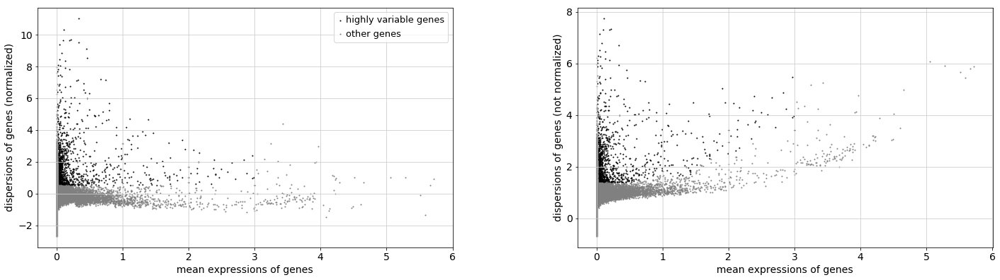

In [17]:
filter_result = sc.pp.filter_genes_dispersion(
    adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result)

In [18]:
adata

AnnData object with n_obs × n_vars = 87947 × 24245 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids-HCATisStab7413619', 'gene_ids-HCATisStab7413620', 'gene_ids-HCATisStab7413621', 'gene_ids-HCATisStab7413622', 'gene_ids-HCATisStab7587201', 'gene_ids-HCATisStab7587204', 'gene_ids-HCATisStab7587207', 'gene_ids-HCATisStab7587210', 'gene_ids-HCATisStab7619064', 'gene_ids-HCATisStab7619065', 'gene_ids-HCATisStab7619066', 'gene_ids-HCATisStab7619067', 'gene_ids-HCATisStab7646028', 'gene_ids-HCATisStab7646029', 'gene_ids-HCATisStab7646030', 'gene_ids-HCATisStab7646031', 'gene_ids-HCATisStabAug177184858', 'gene_ids-HCATisStabAug177184862', 'gene_ids-HCATisStabAug177184863', 'gene_ids-HCATisStabAug177376562', 'gene_ids-HCATisStabAug177376564', 'gene_ids-HCATisStabAug177376566', 'gene_ids-HCATisStabAug177376568', 'n_cells'

In [19]:
fulldata=adata
fulldata.write('oesophagus.full.h5ad')

In [413]:
adata = adata[:, filter_result.gene_subset]

In [ ]:
adata

Logarithmize the data.

In [ ]:
sc.pp.log1p(adata)

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [ ]:
sc.pp.regress_out(adata, ['n_counts'])

In [ ]:
sc.pp.regress_out(adata, ['percent_mito'])

In [ ]:
sc.pp.regress_out(adata, ['Donor'])

In [ ]:
sc.pp.scale(adata, max_value=10)

Save the result.

In [ ]:
#adata.write('oesophagus.h5ad')

## PCA

Compute PCA and make a scatter plot.

In [399]:
sc.tl.pca(adata)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.


In [400]:
adata.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat

In [401]:
#adata.write('oesophagus.h5ad')

In [451]:
#adata = sc.read('oesophagus.h5ad')

In [403]:
adata

AnnData object with n_obs × n_vars = 87947 × 1591 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts'
    var: 'gene_ids-HCATisStab7413619', 'gene_ids-HCATisStab7413620', 'gene_ids-HCATisStab7413621', 'gene_ids-HCATisStab7413622', 'gene_ids-HCATisStab7587201', 'gene_ids-HCATisStab7587204', 'gene_ids-HCATisStab7587207', 'gene_ids-HCATisStab7587210', 'gene_ids-HCATisStab7619064', 'gene_ids-HCATisStab7619065', 'gene_ids-HCATisStab7619066', 'gene_ids-HCATisStab7619067', 'gene_ids-HCATisStab7646028', 'gene_ids-HCATisStab7646029', 'gene_ids-HCATisStab7646030', 'gene_ids-HCATisStab7646031', 'gene_ids-HCATisStabAug177184858', 'gene_ids-HCATisStabAug177184862', 'gene_ids-HCATisStabAug177184863', 'gene_ids-HCATisStabAug177376562', 'gene_ids-HCATisStabAug177376564', 'gene_ids-HCATisStabAug177376566', 'gene_ids-HCATisStabAug177376568', 'n_cells'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

## BBKNN correction and UMAP plot

In [404]:
bbknn.bbknn(adata, batch_key='patient',neighbors_within_batch = 4)
sc.tl.umap(adata)

computing batch balanced neighbors
    finished (0:00:40.85) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:04:26.90) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [405]:
sc.tl.leiden(adata, resolution=0.9)


running Leiden clustering
    finished (0:06:02.98) --> found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


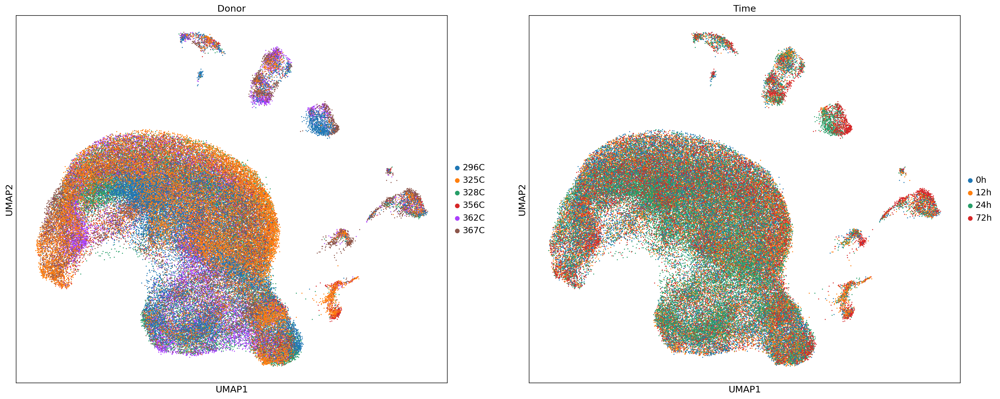

In [427]:
pylab.rcParams['figure.figsize'] = (12, 10)

sc.pl.umap(adata,color=['Donor','Time'], size=10)

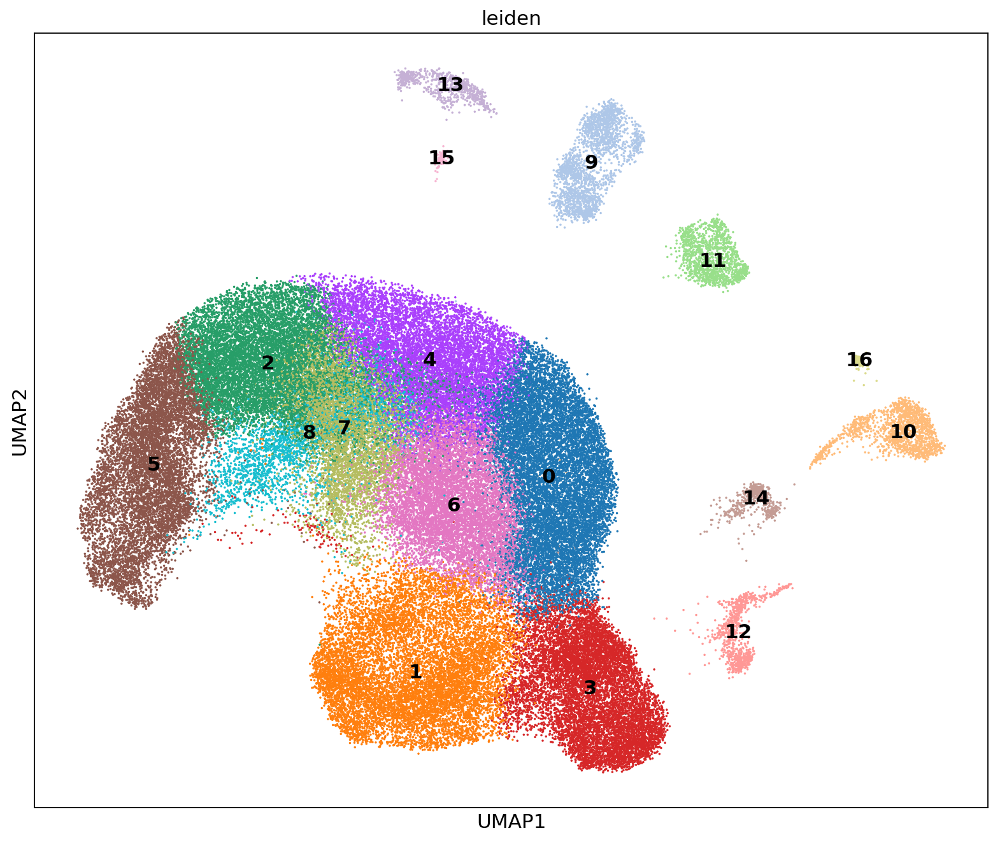

In [428]:
sc.pl.umap(adata,color=['leiden'], size=10, legend_loc='on data')

In [356]:
#adata.write('oesophagus.h5ad')

In [ ]:
marker_genes = ['PTPRC',#immune
                  'CD14', 'VCAN', 'FCN1', #Monocyte
                  'APOE', 'CD5L',#Macrophage
                'LYZ', #mono/macro
                  'IL3RA', 'CLEC4C', #plasmacytoid DC
                'CLEC9A', 'XCR1', #cDC1
                  'CD1C',  'CLEC10A', #cDC2
                  'CD34', 'PROM1', 'HOXA9', #Cd34 progenitor
                  'GP9', 'PF4', 'PPBP',#platelets
                'TPSB2', #Mast cells
                
                  'CD19', 'CD79A', 'MS4A1', #B-cell
                  'SDC1', 'XBP1', 'JCHAIN', #Plasma cells
                  'IGHM', 'IGHG1', #Plasma cells
                
                  'CD3E','CD4', 'CD8A', #T-cells CD4 or CD8
                        'GZMB', 'GNLY', 'PRF1',#Cytotoxic T CTL
                'FCGR3A', 'TRGV2' ,#gamma delta T-cells
                        'SLC4A10',  'KLRB1' ,#MAIT cells
                       'LEF1', 'CCR7', #Naive
                        'FOXP3', 'IL2RA', #Treg
                       'CXCR5', 'ICOS', 'PDCD1',  #Tfh 
                  'IL7R', 'KLRB1', 'AREG', 'TNFSF13B', #ILC
                  'NCR1', 'NCAM1', 'CD160', 'FCGR3A', #NK
                
                  'MKI67', 'TUBB', 'H2AFZ','CDK1', #Dividing
                
                  'CR2', 'CD27',  'TNFRSF13B', #Mantle B cells
                  'IGHD', 'FCER2', 'TCL1A', 'YBX3', 'IL4R', #Follicular B cells
                
                'KRT4', 'KRT5', 'ECM1', #Keratinocyste basal and stratified
                'PECAM1', 'CLEC14A', #Endothelial
                'SLPI', #Glands Serous secreting cells
                'TFF3', 'MUC5B', #Glands TFF3+ / MUC5B -
                'SERPINE2', 'FN1', 'SRGN', 'S100A4', 'PLPP1', #Glands subcluster
                'LTF', #Serous secreting cells LTF+ / SLPI+
                'TFF1', 'AQP5', #Mucous secreting cells TFF3 + / MUC5B+
                'DCN','COL1A2', 'FBLN1', #Stroma
               ]

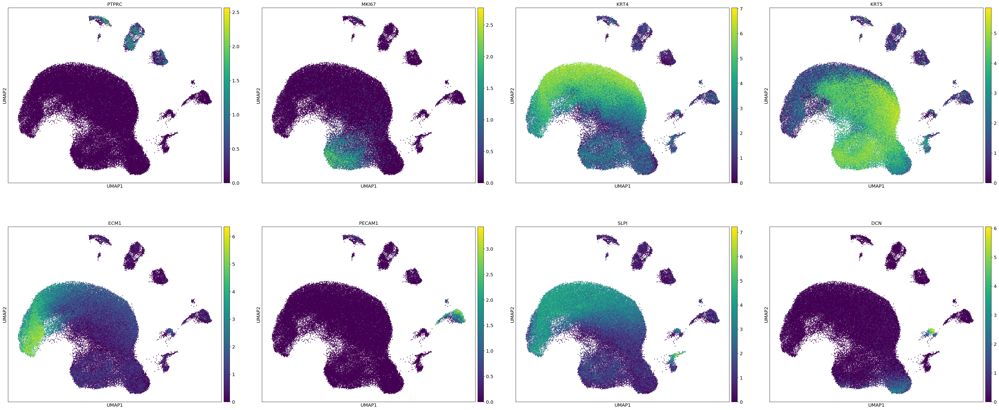

In [265]:
sc.pl.umap(adata,color=['PTPRC',#Immune cells
                        'MKI67', #Dividing
                        'KRT4', # Stratified Keratinocytes
                        'KRT5', # Basal layer of keratinocytes
                        'ECM1', #Keratinocytes outer layer
                        'PECAM1', #Endothelial
                'SLPI', #Glands Serous secreting cells
                'DCN',#Stroma
                       ], size=20)

Clusters are renamed based on known markers

In [457]:
new_cluster_names = [
    'Epi_stratified','Epi_dividing',
    'Epi_stratified', 'Epi_suprabasal',
    'Epi_stratified', 'Epi_upper',
    'Epi_stratified', 'Epi_stratified',
    'Epi_stratified', 'Immune',
    'Endothelial', 'Immune', 
    'Glands', 'Immune',
'Stroma','Immune',
'Endothelial']


conv = {str(i):name for i,name in enumerate(new_cluster_names)}

adata.obs['Celltype'] = [conv[x] for x in adata.obs['leiden']]

In [458]:
adata.obs.Celltype.value_counts()

Epi_stratified    50469
Epi_dividing      10870
Epi_suprabasal    10000
Epi_upper          9150
Immune             4366
Endothelial        1677
Glands              867
Stroma              548
Name: Celltype, dtype: int64

... storing 'Celltype' as categorical


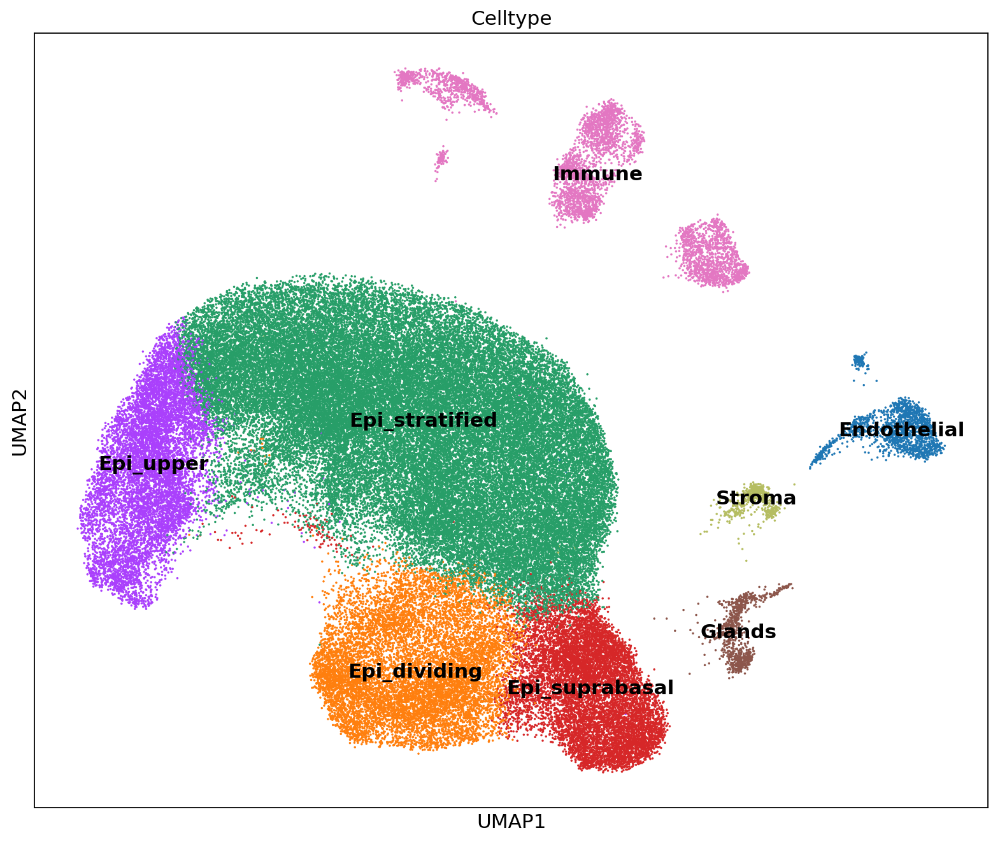

In [459]:
sc.pl.umap(adata,color=['Celltype'], size=10, legend_loc='on data')

In [460]:
adata.write('oesophagus.h5ad')

## Subsetting Immune cells

In [159]:
#adata = sc.read('oesophagus.h5ad')
#fulldata=sc.read('oesophagus.full.h5ad')
#tiss=sc.read('oesophagus_imm.h5ad')

In [56]:
tiss=fulldata[[i in ['Immune'] for i in adata.obs['Celltype']]]

In [57]:
tiss.raw = sc.pp.log1p(tiss, copy=True)
sc.pp.normalize_per_cell(tiss, counts_per_cell_after=1e4)
filter_result = sc.pp.filter_genes_dispersion(
    tiss.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pl.filter_genes_dispersion(filter_result)
tiss = tiss[:, filter_result.gene_subset]
sc.pp.log1p(tiss)
sc.pp.regress_out(tiss, ['n_counts'])

regressing out ['n_counts']
    sparse input is densified and may lead to high memory use
    finished (0:00:25.51)


In [58]:
sc.pp.regress_out(tiss, ['percent_mito'])

regressing out ['percent_mito']
    finished (0:00:22.19)


In [59]:
sc.pp.regress_out(tiss, ['Donor'])

regressing out ['Donor']
    finished (0:00:24.85)


In [60]:
sc.pp.scale(tiss, max_value=10)
sc.tl.pca(tiss)
tiss.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
bbknn.bbknn(tiss, batch_key='patient',neighbors_within_batch = 4)
sc.tl.umap(tiss)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing batch balanced neighbors
    finished (0:00:01.34) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:12.62) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [81]:
sc.tl.leiden(tiss,resolution=1.2)

running Leiden clustering
    finished (0:00:02.35) --> found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


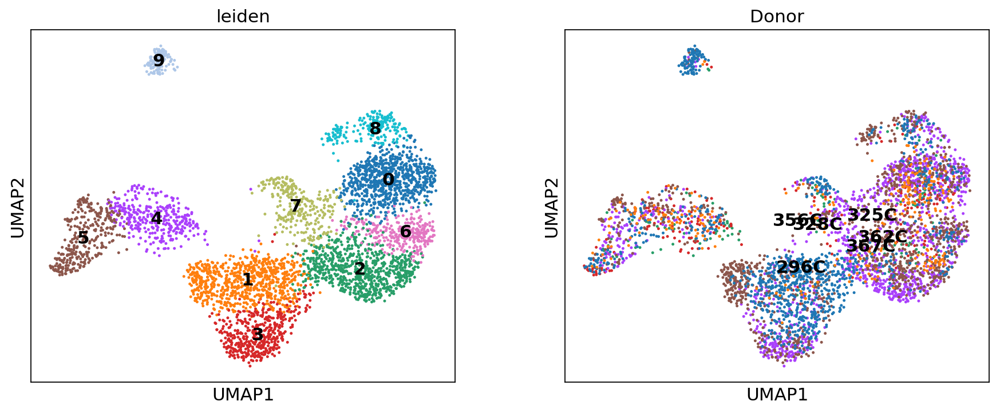

In [82]:
pylab.rcParams['figure.figsize'] = (6, 5)
sc.pl.umap(tiss,color=['leiden','Donor'], size=20)

In [71]:
marker_genes = ['CD3E','CD4', 'CD8A', #T-cells CD4 or CD8
                'CD14', 'VCAN', 'FCN1', #Monocyte
                  'APOE', #Macrophage
                'CD1C',  'CLEC10A', #cDC2
                'TPSB2', #Mast cells
                  'CD19', 'CD79A',#B-cell
                'CR2', 'CD27',  'TNFRSF13B', #CD27pos B cells
                  'IGHD', 'FCER2', 'TCL1A', 'YBX3', 'IL4R', #CD27neg B cells
                'GZMB', 'GNLY', 'PRF1',#Cytotoxic T CTL
                'NCR1', 'NCAM1' #NK
               ]

In [23]:
pylab.rcParams['figure.figsize'] = (12, 10)
#sc.pl.umap(tiss,color=marker_genes, size=40)

In [ ]:
tiss2=tiss[[i in ['0','2','6','7','8'] for i in tiss.obs['leiden']]]

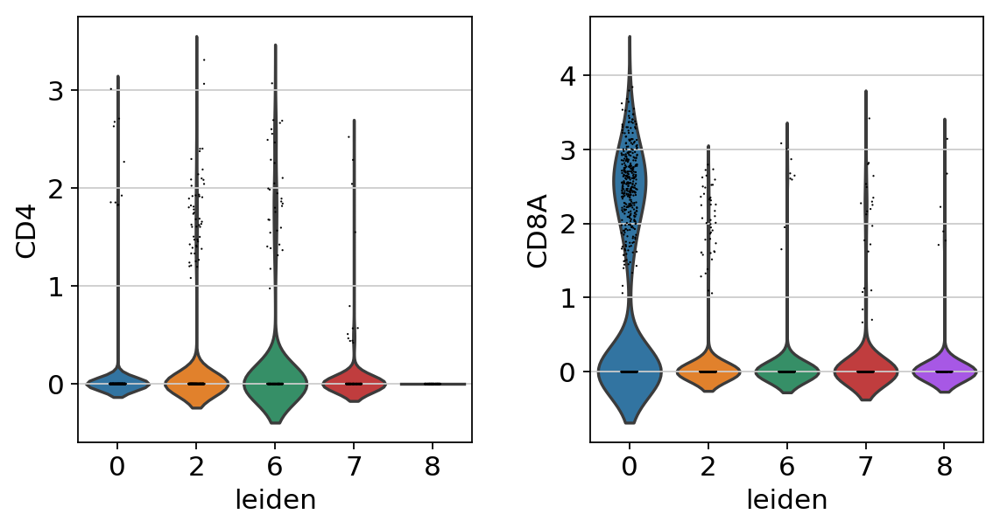

In [107]:
sc.pl.violin(tiss2, ['CD4', 'CD8A'], groupby='leiden')

In [271]:
marker_genes = ['CD3E','CD4', 'CD8A', #T-cells CD4 or CD8
                'CD14', 'VCAN', 'FCN1', #Monocyte
                  'APOE', #Macrophage
                'CD1C',  'CLEC10A', #cDC2
                'TPSB2', #Mast cells
                  'CD19', 'CD79A',#B-cell
                'CR2', 'CD27',  'TNFRSF13B', #CD27pos B cells
                  'IGHD', 'FCER2', 'TCL1A', 'YBX3', 'IL4R', #CD27neg B cells
                'GZMB', 'GNLY', 'PRF1',#Cytotoxic T CTL
                'NCR1', 'NCAM1' #NK
               ]

In [274]:
cdm_out = calculate_markers(tiss,'leiden')

0
1
2
3
4
5
6
7
8
9


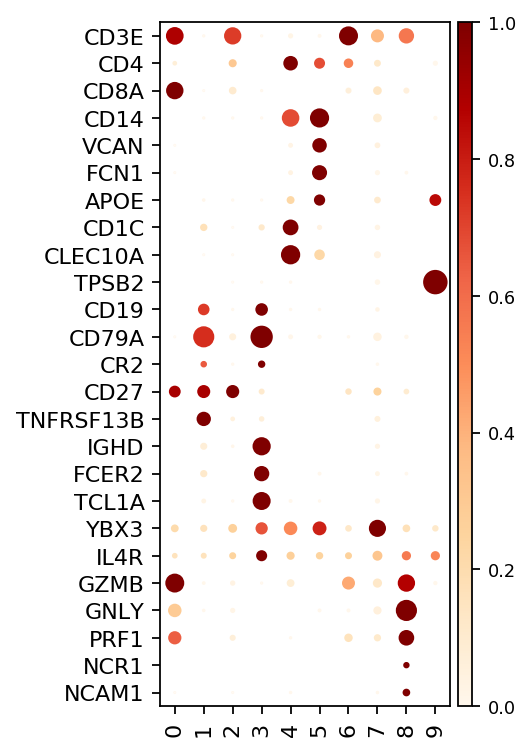

In [275]:
draw_marker_blob(tiss,cdm_out,marker_genes,min_drop_ratio=0)

In [119]:

new_cluster_names = [
    'T_CD8', 'B_CD27pos',
    'T_CD4', 'B_CD27neg',
    'Dendritic_Cells', 'Mono_macro',
    'T_CD4', 'T_CD4',
    'NK_T_CD8_Cytotoxic', 'Mast_cell']


In [120]:
conv = {str(i):name for i,name in enumerate(new_cluster_names)}

In [121]:
tiss.obs['anno_1'] = [conv[x] for x in tiss.obs['leiden']]

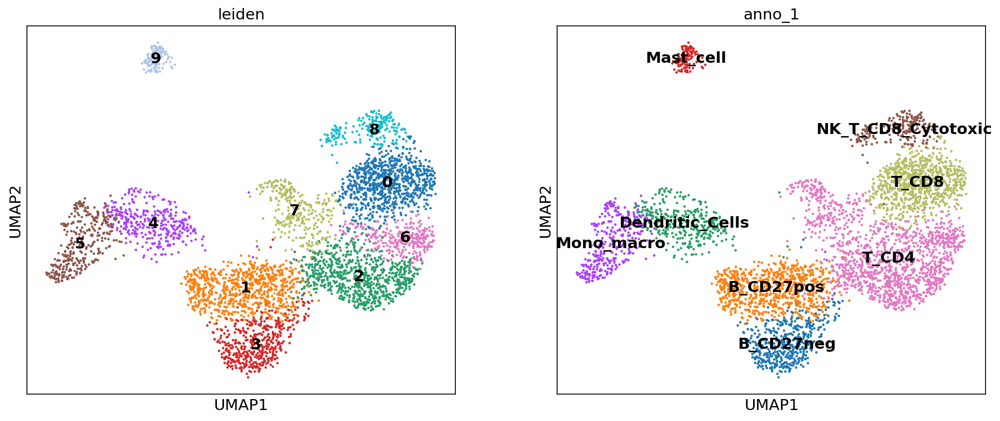

In [125]:
pylab.rcParams['figure.figsize'] = (7, 6)
sc.pl.umap(tiss,color=['leiden','anno_1'], legend_loc='on data', size=20)

In [126]:
tiss.write('oesophagus_imm.h5ad')

## Small clusters

In [433]:
#tiss=sc.read('oesophagus_other.h5ad')

In [225]:
tiss=fulldata[[i in ['Endothelial', 'Glands', 'Stroma'] for i in adata.obs['Celltype']]]

In [226]:
tiss.raw = sc.pp.log1p(tiss, copy=True)
sc.pp.normalize_per_cell(tiss, counts_per_cell_after=1e4)
filter_result = sc.pp.filter_genes_dispersion(
    tiss.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pl.filter_genes_dispersion(filter_result)
tiss = tiss[:, filter_result.gene_subset]
sc.pp.log1p(tiss)
sc.pp.regress_out(tiss, ['n_counts', 'percent_mito'])


regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:36.42)


In [227]:
sc.pp.regress_out(tiss, ['Donor'])
sc.pp.scale(tiss, max_value=10)
sc.tl.pca(tiss)
tiss.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
bbknn.bbknn(tiss, batch_key='patient',neighbors_within_batch = 4)
sc.tl.umap(tiss)

regressing out ['Donor']
    finished (0:00:34.42)
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing batch balanced neighbors
    finished (0:00:00.98) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:08.60) --> added
    'X_umap', UMAP coordinates (adata.obsm)


In [280]:
sc.tl.leiden(tiss,resolution=1.2)

running Leiden clustering
    finished (0:00:01.40) --> found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical)


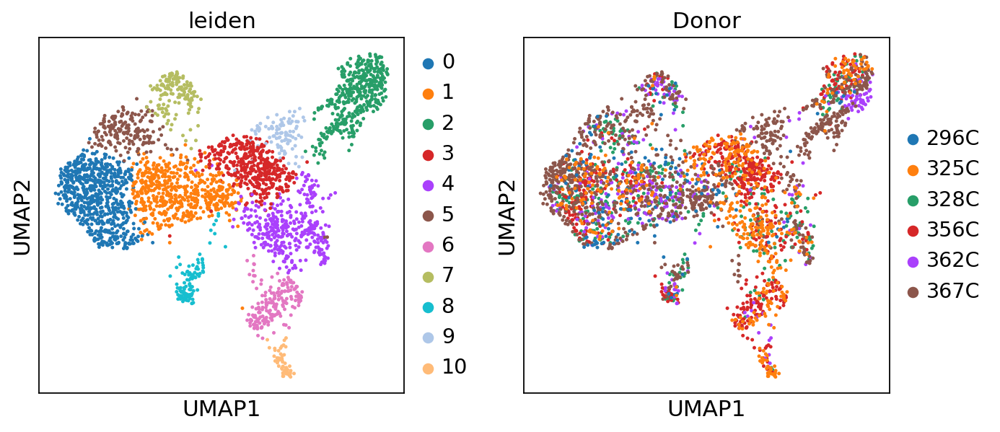

In [341]:
sc.pl.umap(tiss,color=['leiden','Donor'], size=20)

In [434]:
markers=[ 'SLPI','LTF',  #Glands Serous secreting cells
                'TFF3', 'MUC5B', #Glands TFF3+ / MUC5B -
                'DCN','COL1A2', 'FBLN1', #Stroma
         'PECAM1', 'CLEC14A', #Endothelial
        'VWF', 'CCL21', #vascular vs lymphatic
         'KRT5', #Epithelial basal
         'KRT7', 'KRT23', #Ducts
        ]

In [22]:

#sc.pl.umap(tiss,color=markers, size=20)


In [439]:
new_cluster_names = [
    'Blood_vessel', 'Blood_vessel',
    'Stroma', 'Epi_basal',
    'Epi_basal', 'Blood_vessel',
    'Glands_duct', 'Blood_vessel',
'Lymph_vessel','Stroma',
'Glands_mucous']


In [440]:
conv = {str(i):name for i,name in enumerate(new_cluster_names)}

In [441]:
tiss.obs['anno_1'] = [conv[x] for x in tiss.obs['leiden']]

... storing 'anno_1' as categorical


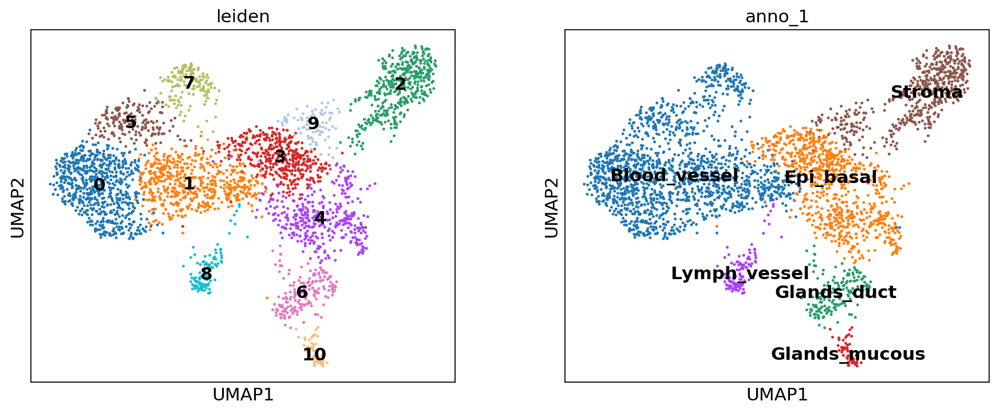

In [442]:
pylab.rcParams['figure.figsize'] = (6, 5)
sc.pl.umap(tiss,color=['leiden','anno_1'], legend_loc='on data', size=20)

In [436]:
cdm_out = calculate_markers(tiss,'leiden')

0
1
10
2
3
4
5
6
7
8
9


In [437]:
markers=[ 'SLPI','LTF',  #Glands Serous secreting cells
                'TFF3', 'MUC5B', #Glands TFF3+ / MUC5B -
                'DCN','COL1A2', 'FBLN1', #Stroma
         'PECAM1', 'CLEC14A', #Endothelial
        'VWF', 'CCL21', #vascular vs lymphatic
         'KRT5', #Epithelial basal
         'KRT7', 'KRT23' # Gland ducts
        ]

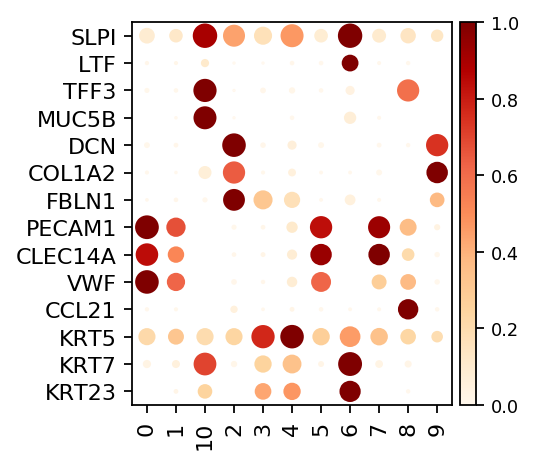

In [438]:

draw_marker_blob(tiss,cdm_out,markers,min_drop_ratio=0)

In [443]:
tiss.write('oesophagus_other.h5ad')

## Combine identities

In [461]:
#adata = sc.read('oesophagus.h5ad')
imm = sc.read('oesophagus_imm.h5ad')
other = sc.read('oesophagus_other.h5ad')

In [462]:
adata.obs['cell_types'] = adata.obs['Celltype']

In [463]:
update_label(imm,'anno_1',adata,'cell_types','cell_types_updated')

In [464]:
update_label(other,'anno_1',adata,'cell_types_updated','cell_types_updated2')

In [465]:
adata.obs['Celltypes'] = adata.obs['cell_types_updated2']

... storing 'cell_types_updated' as categorical
... storing 'cell_types_updated2' as categorical
... storing 'Celltypes' as categorical


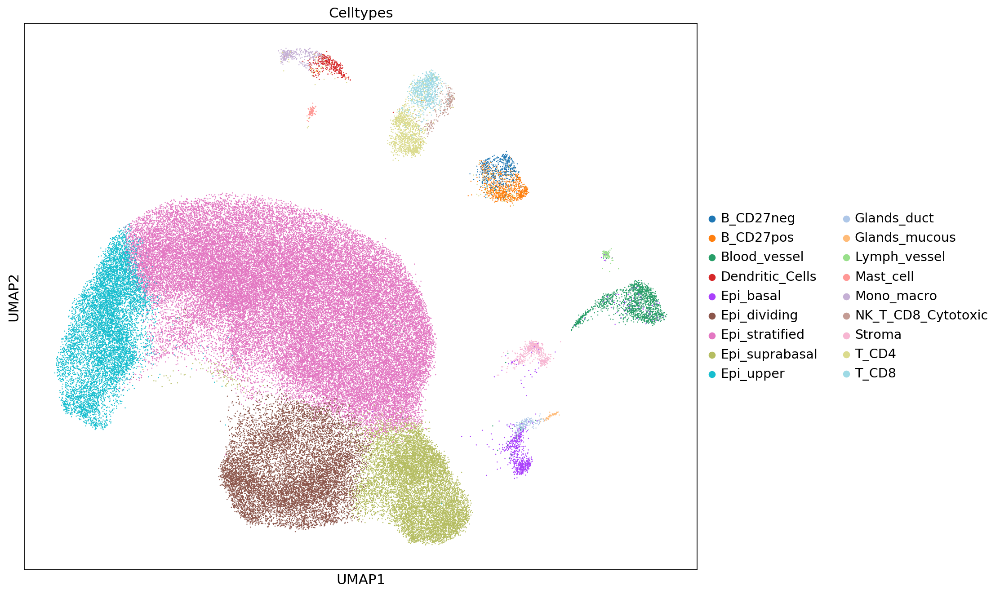

In [466]:
pylab.rcParams['figure.figsize'] = (12, 10)
sc.pl.umap(adata,color=['Celltypes'], #legend_loc='on data', 
           size=5)

In [21]:
#sc.pl.umap(adata,color=['Celltypes'],
#           size=5, legend_loc='on data')

In [468]:
cdm_out = calculate_markers(adata,'Celltypes')

B_CD27neg
B_CD27pos
Blood_vessel
Dendritic_Cells
Epi_basal
Epi_dividing
Epi_stratified
Epi_suprabasal
Epi_upper
Glands_duct
Glands_mucous
Lymph_vessel
Mast_cell
Mono_macro
NK_T_CD8_Cytotoxic
Stroma
T_CD4
T_CD8


In [475]:
markers=['KRT5', 'SCPEP1', 'ITGA6', #Epithelial basal
         'MKI67', #Dividing
                        'KRT4', # Stratified Keratinocytes
                        'ECM1', #Keratinocytes outer layer
         'KRT7', 'KRT23', # Gland ducts     
         'TFF3', 'MUC5B', #Glands TFF3+ / MUC5B -
                'DCN','COL1A2', 'FBLN1', #Stroma
         'PECAM1', 'CLEC14A', #Endothelial
        'VWF', 'CCL21', #vascular vs lymphatic
            'PTPRC',#Immune cells
                        
                        'CD3E','CD4', 'CD8A', #T-cells CD4 or CD8
                'CD14', 'VCAN', 'FCN1', #Monocyte
                  'APOE', #Macrophage
                'CD1C',  'CLEC10A', #cDC2
                'TPSB2', #Mast cells
                  'CD19', 'CD79A',#B-cell
                'CD27',  'TNFRSF13B', #CD27pos B cells
                  'IGHD', 'FCER2', 'TCL1A',  #CD27neg B cells
                'GZMB', 'GNLY', 'PRF1',#Cytotoxic T CTL
                'NCR1', 'NCAM1' #NK
               ]

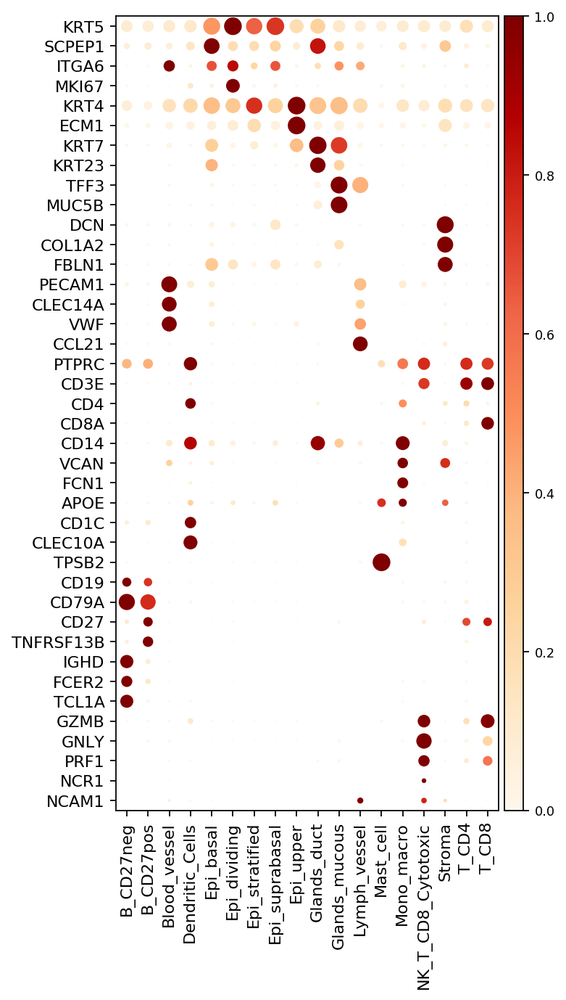

In [476]:

draw_marker_blob(adata,cdm_out,markers,min_drop_ratio=0)

In [477]:
adata.write('oesophagus_annot.h5ad')

In [478]:
adata

AnnData object with n_obs × n_vars = 87947 × 1591 
    obs: 'Donor', 'Time', 'batch', 'donor_time', 'organ', 'patient', 'sample', 'time_donor', 'timepoint', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'Celltype', 'cell_types', 'cell_types_updated', 'cell_types_updated2', 'Celltypes'
    var: 'gene_ids-HCATisStab7413619', 'gene_ids-HCATisStab7413620', 'gene_ids-HCATisStab7413621', 'gene_ids-HCATisStab7413622', 'gene_ids-HCATisStab7587201', 'gene_ids-HCATisStab7587204', 'gene_ids-HCATisStab7587207', 'gene_ids-HCATisStab7587210', 'gene_ids-HCATisStab7619064', 'gene_ids-HCATisStab7619065', 'gene_ids-HCATisStab7619066', 'gene_ids-HCATisStab7619067', 'gene_ids-HCATisStab7646028', 'gene_ids-HCATisStab7646029', 'gene_ids-HCATisStab7646030', 'gene_ids-HCATisStab7646031', 'gene_ids-HCATisStabAug177184858', 'gene_ids-HCATisStabAug177184862', 'gene_ids-HCATisStabAug177184863', 'gene_ids-HCATisStabAug177376562', 'gene_ids-HCATisStabAug177376564', 'gene_ids-HCATisStabAug177376566', 'gene_ids-HC

In [480]:
adata.obs.to_csv("oesophagus_meta.csv")

In [485]:
numpy.savetxt("oesophagus_X_umap.csv", adata.obsm.X_umap, delimiter=",")

In [495]:
genefilelines = []
for name,geneid in zip(adata.var_names, adata.var['gene_ids-HCATisStab7413619'].values):
    genefilelines.append(geneid+'\t'+name+'\n')

In [496]:
genefilelines[:5]

['ENSG00000187608\tISG15\n',
 'ENSG00000186891\tTNFRSF18\n',
 'ENSG00000186827\tTNFRSF4\n',
 'ENSG00000162576\tMXRA8\n',
 'ENSG00000215014\tRP5-832C2.5\n']

In [497]:
import scipy.io
import os

os.makedirs('oesophagus-rawdata')
with open('oesophagus-rawdata/genes.tsv','w') as fid:
    fid.writelines(genefilelines)

In [498]:
with open('oesophagus-rawdata/barcodes.tsv','w') as fid:
    fid.writelines([i+'\n' for i in adata.obs_names])

In [20]:
#adata.raw.X.T

In [538]:
adata.X.T

<24245x87947 sparse matrix of type '<class 'numpy.float32'>'
	with 155926526 stored elements in Compressed Sparse Column format>

In [539]:
scipy.io.mmwrite('oesophagus-rawdata/matrix.mtx',adata.X.T)